# Understanding the Taxi Environment

The Taxi environment is a 5x5 grid world with four designated locations: R(ed), G(reen), B(lue), and Y(ellow). 

## Actions
The taxi can take 6 actions:
- 0: Move south
- 1: Move north
- 2: Move east
- 3: Move west
- 4: Pickup passenger
- 5: Drop off passenger

## Rewards
- -1 for each action
- +20 for successful dropoff
- -10 for illegal pickup/dropoff actions



In [1]:
import gymnasium as gym
import numpy as np
import random
import time
from IPython.display import clear_output  # Helps clear the screen when rendering

In [2]:
# Create the Taxi-v3 environment with human rendering so we can watch it later
env = gym.make("Taxi-v3", render_mode="ansi")

# Reset the environment to start fresh
state, info = env.reset()
print("Environment created! There are", env.observation_space.n, "possible states")
print("There are", env.action_space.n, "possible actions (0-5)")
print("- 0: Move south")
print("- 1: Move north")
print("- 2: Move east")
print("- 3: Move west")
print("- 4: Pickup passenger")
print("- 5: Drop off passenger")


Environment created! There are 500 possible states
There are 6 possible actions (0-5)
- 0: Move south
- 1: Move north
- 2: Move east
- 3: Move west
- 4: Pickup passenger
- 5: Drop off passenger


In [3]:
# Q-Table = rows are states (500), columns are actions (6)
# Initially everything is 0 because the agent knows nothing yet
q_table = np.zeros([env.observation_space.n, env.action_space.n])

print("Q-table shape:", q_table.shape)
print("Example of first 5 states and their Q-values:\n", q_table[:10])

Q-table shape: (500, 6)
Example of first 5 states and their Q-values:
 [[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]


In [4]:
print("State Space: %s"%env.observation_space)

State Space: Discrete(500)


In [5]:
# env is wrapped (TimeLimit). Use the underlying env to access Taxi-specific helpers like encode.
initial_state = env.unwrapped.encode(3, 1, 3, 0)
print("Initial State:", initial_state)

Initial State: 332


In [6]:
#render the locations specified
env.s = initial_state
print (env.render())

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+




In [8]:
# Access the underlying TaxiEnv (unwrapped) which exposes the transition dict `P`
env.unwrapped.P[initial_state]

{0: [(1.0, 432, -1, False)],
 1: [(1.0, 232, -1, False)],
 2: [(1.0, 352, -1, False)],
 3: [(1.0, 332, -1, False)],
 4: [(1.0, 332, -10, False)],
 5: [(1.0, 332, -10, False)]}

In [9]:
#intial values
epochs_normal = 0
penalties_normal = 0
reward_normal = 0

In [10]:
#animation frames
frames = []

In [11]:
#the taxi has not reached its destination
done_normal = False

In [14]:
while not done_normal:
    #select a random action from a set of possible actions
    action = env.action_space.sample()
    # gymnasium env.step returns: (next_state, reward, terminated, truncated, info)
    state, reward_normal, terminated, truncated, info_normal = env.step(action)
    # combine termination flags into done_normal
    done_normal = terminated or truncated

    if reward_normal == -10:
        penalties_normal += 1
    
    # Put each rendered frame into dict for animation
    # Note: wrapper.render() no longer accepts a 'mode' argument; call render() directly.
    frames.append({
        'frame': env.render(),
        'state': state,
        'action': action,
        'reward': reward_normal
        }
    )
    
    epochs_normal += 1
    
    
print("Timesteps taken: {}".format(epochs_normal))
print("Penalties incurred: {}".format(penalties_normal))

Timesteps taken: 200
Penalties incurred: 66


In [16]:
# Hyperparameters - you can change these later to see the effect
total_episodes = 500000      # How many games we play to train
learning_rate = 0.1         # How fast the agent learns (alpha)
discount_rate = 0.99        # How much we care about future rewards (gamma)

epsilon = 1.0               # Start exploring a lot (1.0 = 100% random)
max_epsilon = 1.0
min_epsilon = 0.01
decay_rate = 0.0001         # How fast exploration goes down

print("Training settings ready!")

Training settings ready!


In [17]:
# This cell will take 1-3 minutes depending on your computer
rewards_all_episodes = []

for episode in range(total_episodes):
    state, info = env.reset()
    done = False
    total_reward = 0
    
    while not done:
        # --- Exploration vs Exploitation ---
        if random.uniform(0, 1) < epsilon:
            action = env.action_space.sample()  # Pick random action
        else:
            action = np.argmax(q_table[state])  # Pick best known action
        
        # Take the action and observe what happens
        next_state, reward, done, truncated, info = env.step(action)
        # (truncated is for time limit, we treat it same as done)
        done = done or truncated
        
        # --- Q-Learning formula ---
        # Q(s,a) ← Q(s,a) + α [reward + γ * max Q(s',a') - Q(s,a)]
        best_future_action = np.max(q_table[next_state])
        q_table[state, action] = q_table[state, action] + learning_rate * (
            reward + discount_rate * best_future_action - q_table[state, action])
        
        # Move to the next state
        state = next_state
        total_reward += reward
    
    # Reduce epsilon (explore less over time)
    epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay_rate * episode)
    
    rewards_all_episodes.append(total_reward)
    
    # Print progress every 5000 episodes
    if (episode + 1) % 5000 == 0:
        avg_reward = np.mean(rewards_all_episodes[-1000:])  # average of last 1000
        print(f"Episode {episode + 1}/{total_episodes} | Avg Reward (last 1000): {avg_reward:.2f} | Epsilon: {epsilon:.3f}")

print("Training finished!")

Episode 5000/500000 | Avg Reward (last 1000): -95.22 | Epsilon: 0.611
Episode 10000/500000 | Avg Reward (last 1000): -26.86 | Epsilon: 0.374
Episode 15000/500000 | Avg Reward (last 1000): -8.01 | Epsilon: 0.231
Episode 20000/500000 | Avg Reward (last 1000): -1.13 | Epsilon: 0.144
Episode 25000/500000 | Avg Reward (last 1000): 2.56 | Epsilon: 0.091
Episode 30000/500000 | Avg Reward (last 1000): 4.65 | Epsilon: 0.059
Episode 35000/500000 | Avg Reward (last 1000): 5.92 | Epsilon: 0.040
Episode 40000/500000 | Avg Reward (last 1000): 6.51 | Epsilon: 0.028
Episode 45000/500000 | Avg Reward (last 1000): 7.02 | Epsilon: 0.021
Episode 50000/500000 | Avg Reward (last 1000): 6.79 | Epsilon: 0.017
Episode 55000/500000 | Avg Reward (last 1000): 7.31 | Epsilon: 0.014
Episode 60000/500000 | Avg Reward (last 1000): 7.34 | Epsilon: 0.012
Episode 65000/500000 | Avg Reward (last 1000): 7.31 | Epsilon: 0.011
Episode 70000/500000 | Avg Reward (last 1000): 7.19 | Epsilon: 0.011
Episode 75000/500000 | Avg Re

In [18]:
# Split rewards into groups of 1000 episodes and see the progress
training_rewards = np.split(np.array(rewards_all_episodes), total_episodes/2)
averages = [np.mean(group) for group in training_rewards]

print("Average reward per 1000 episodes:")
for i, avg in enumerate(averages):
    print(f"Episodes {i*1000}-{(i+1)*1000-1}: {avg:.2f}")

Average reward per 1000 episodes:
Episodes 0-999: -744.50
Episodes 1000-1999: -794.00
Episodes 2000-2999: -852.50
Episodes 3000-3999: -821.00
Episodes 4000-4999: -780.50
Episodes 5000-5999: -740.00
Episodes 6000-6999: -812.00
Episodes 7000-7999: -816.50
Episodes 8000-8999: -731.00
Episodes 9000-9999: -771.50
Episodes 10000-10999: -744.50
Episodes 11000-11999: -780.50
Episodes 12000-12999: -619.00
Episodes 13000-13999: -713.00
Episodes 14000-14999: -830.00
Episodes 15000-15999: -708.50
Episodes 16000-16999: -767.00
Episodes 17000-17999: -852.50
Episodes 18000-18999: -762.50
Episodes 19000-19999: -789.50
Episodes 20000-20999: -446.00
Episodes 21000-21999: -717.50
Episodes 22000-22999: -762.50
Episodes 23000-23999: -839.00
Episodes 24000-24999: -749.00
Episodes 25000-25999: -654.50
Episodes 26000-26999: -654.50
Episodes 27000-27999: -834.50
Episodes 28000-28999: -762.50
Episodes 29000-29999: -731.00
Episodes 30000-30999: -843.50
Episodes 31000-31999: -771.50
Episodes 32000-32999: -749.00


In [ ]:
#print("Close the window that opens to continue")

for episode in range(10):
    env = gym.make("Taxi-v3", render_mode="ansi")
    state, info = env.reset()
    
    done = False
    print(f"\n--- Episode {episode + 1} ---")
    time.sleep(1)
    
    total_reward = 0
    steps = 0
    
    while not done:
        # Always pick the best action now (no exploration)
        action = np.argmax(q_table[state])
        
        state, reward, done, truncated, info = env.step(action)
        done = done or truncated
        
        total_reward += reward
        steps += 1
        
        env.render()           # Shows the taxi moving
        time.sleep(0.3)        # Slow down so we can watch
        #clear_output(wait=True)
    
    print(f"Episode finished in {steps} steps with reward {total_reward}")
print("Demo finished! The agent has learned to solve the taxi problem.")
print("Average reward per 1000 episodes:")



--- Episode 1 ---
Episode finished in 12 steps with reward 9

--- Episode 2 ---
Episode finished in 12 steps with reward 9

--- Episode 3 ---


In [28]:
np.save("taxi_q_table.npy", q_table)
print("Q-table saved! You can load it later with np.load('taxi_q_table.npy')")

Q-table saved! You can load it later with np.load('taxi_q_table.npy')


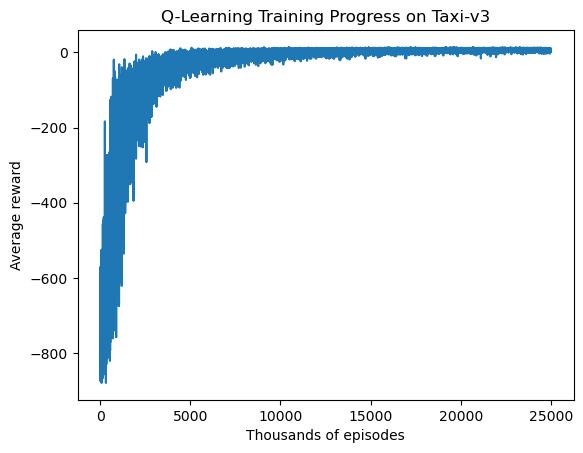

In [29]:
import matplotlib.pyplot as plt
plt.plot([np.mean(training_rewards[i]) for i in range(len(training_rewards))])
plt.xlabel("Thousands of episodes")
plt.ylabel("Average reward")
plt.title("Q-Learning Training Progress on Taxi-v3")
plt.show()